In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_UNET+512-32+sigmoid"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/" 

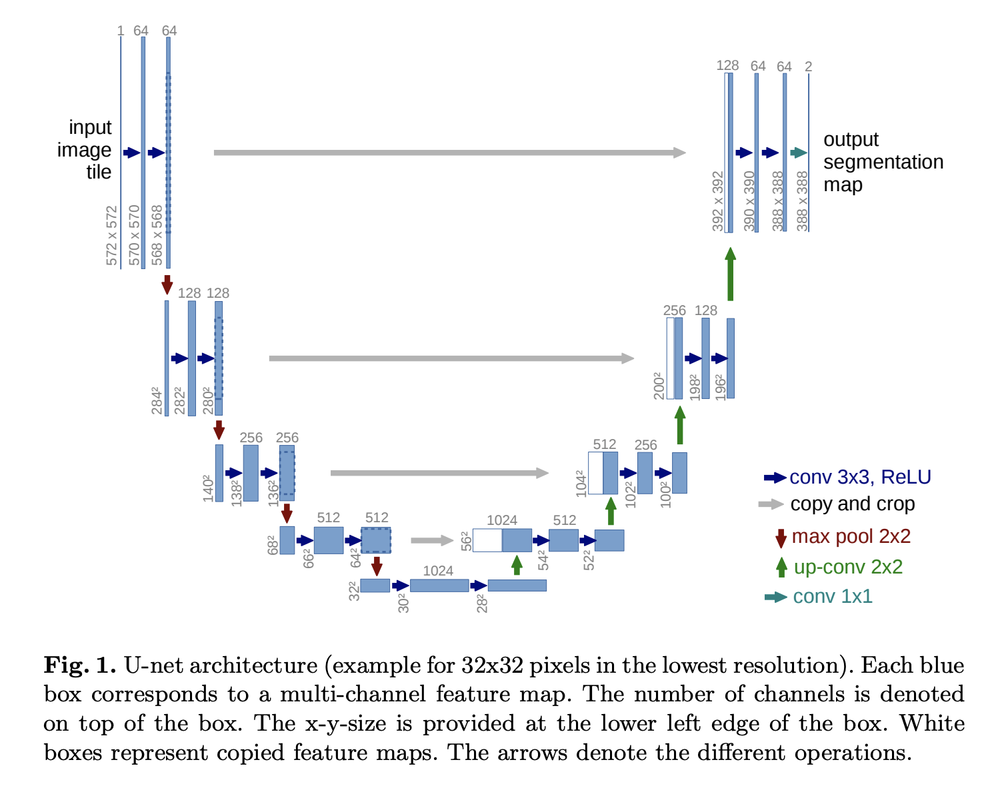

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_unet_model(input_shape, Canaux_de_sortie, by = "prebuild"):

    if by =="from_scratch" :
        base_VGG = VGG16(include_top = False, 
                       weights = "imagenet", 
                       input_shape = input_shape)

        # On interdit l'entrainement des couche de convolution du modèle VGG16
        # Uniquement les paramètres de la couche de décodage seront entrainés
        for layer in base_VGG.layers: 
            layer.trainable = False

        # the bridge (exclude the last maxpooling layer in VGG16) 
        bridge = base_VGG.get_layer("block5_conv3").output
        #print(bridge.shape)

        # Décodeur
        up1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bridge)
        #print(up1.shape)
        concat_1 = concatenate([up1, base_VGG.get_layer("block4_conv3").output], axis=3)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(concat_1)
        conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

        up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
        #print(up2.shape)
        concat_2 = concatenate([up2, base_VGG.get_layer("block3_conv3").output], axis=3)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_2)
        conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

        up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
        #print(up3.shape)
        concat_3 = concatenate([up3, base_VGG.get_layer("block2_conv2").output], axis=3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(concat_3)
        conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

        up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
        #print(up4.shape)
        concat_4 = concatenate([up4, base_VGG.get_layer("block1_conv2").output], axis=3)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(concat_4)
        conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

        conv10 = Conv2D(Canaux_de_sortie, (1, 1), activation='softmax')(conv9)
        #print(conv10.shape)

        model = Model( base_VGG.input, conv10 )
    elif by == "prebuild" :
        from segmentation_models import Unet
        
        model = Unet( 
                backbone_name='vgg16',
                input_shape= input_shape,
                classes= Canaux_de_sortie,
                activation='sigmoid',
                weights=None,
                encoder_weights='imagenet',
                encoder_freeze=True,
                encoder_features='default',
                decoder_block_type='upsampling',
                decoder_filters=(512, 256, 128, 64, 32),
                decoder_use_batchnorm=True,
                
                )
        
    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = False
perte_1 = "jaccard_loss"
img_res = (128,256,3)

In [13]:
model_1 = TL_unet_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=25
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees= 50, target_size=img_res),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_1, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
5/5 [==============================] - 34s 7s/step - loss: 0.8663 - ARI_score: -1.0177 - mean_IoU: 0.1483 - dice_coeff: 0.2572 - Tversky_coef: 0.2204 - val_loss: 0.9386 - val_ARI_score: 0.2266 - val_mean_IoU: 0.0755 - val_dice_coeff: 0.1404 - val_Tversky_coef: 0.1920 - lr: 0.0200
Epoch 2/450
5/5 [==============================] - 33s 7s/step - loss: 0.7987 - ARI_score: 2.5303 - mean_IoU: 0.2065 - dice_coeff: 0.3422 - Tversky_coef: 0.2363 - val_loss: 0.9402 - val_ARI_score: 2.5288 - val_mean_IoU: 0.0808 - val_dice_coeff: 0.1495 - val_Tversky_coef: 0.1959 - lr: 0.0200
Epoch 3/450
5/5 [==============================] - 33s 6s/step - loss: 0.7441 - ARI_score: 0.5602 - mean_IoU: 0.2457 - dice_coeff: 0.3941 - Tversky_coef: 0.2423 - val_loss: 0.9356 - val_ARI_score: 3.7524 - val_mean_IoU: 0.0804 - val_dice_coeff: 0.1488 - val_Tversky_coef: 0.1949 - lr: 0.0200
Epoch 4/450
5/5 [==============================] - 33s 7s/step - loss: 0.7309 - ARI_score: -0.4954 - mean_IoU: 0.2772 - dic

In [16]:
model_1.fit

<bound method Model.fit of <keras.engine.functional.Functional object at 0x7f4d04318970>>

In [17]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.866325,-1.017742,0.148279,0.257245,0.220428,0.938600,0.226627,0.075484,0.140358,0.192042,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
1,0.798748,2.530311,0.206498,0.342174,0.236324,0.940174,2.528762,0.080787,0.149458,0.195864,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
2,0.744062,0.560173,0.245661,0.394103,0.242261,0.935605,3.752403,0.080416,0.148767,0.194931,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
3,0.730943,-0.495430,0.277246,0.434017,0.245846,0.922505,9.670485,0.087190,0.160351,0.198767,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
4,0.710838,-1.119583,0.299195,0.460557,0.248306,0.920762,5.191318,0.092006,0.168452,0.201098,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.253342,-0.342822,0.860772,0.925117,0.271816,0.520855,-0.798654,0.629823,0.772323,0.257583,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
135,0.253896,-0.731146,0.863036,0.926461,0.271965,0.506856,-2.076264,0.643041,0.782291,0.258919,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
136,0.250835,-1.718331,0.862447,0.926133,0.271875,0.500344,-1.069549,0.657754,0.792798,0.259871,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
137,0.249209,0.748246,0.864025,0.927023,0.272050,0.511995,-3.571469,0.636648,0.777500,0.258068,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False


In [18]:
start = 2

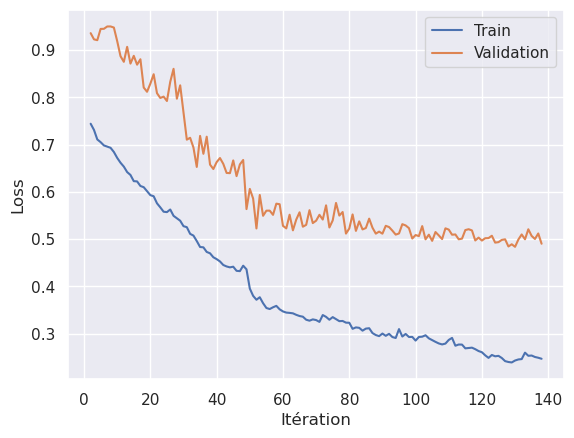

In [19]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


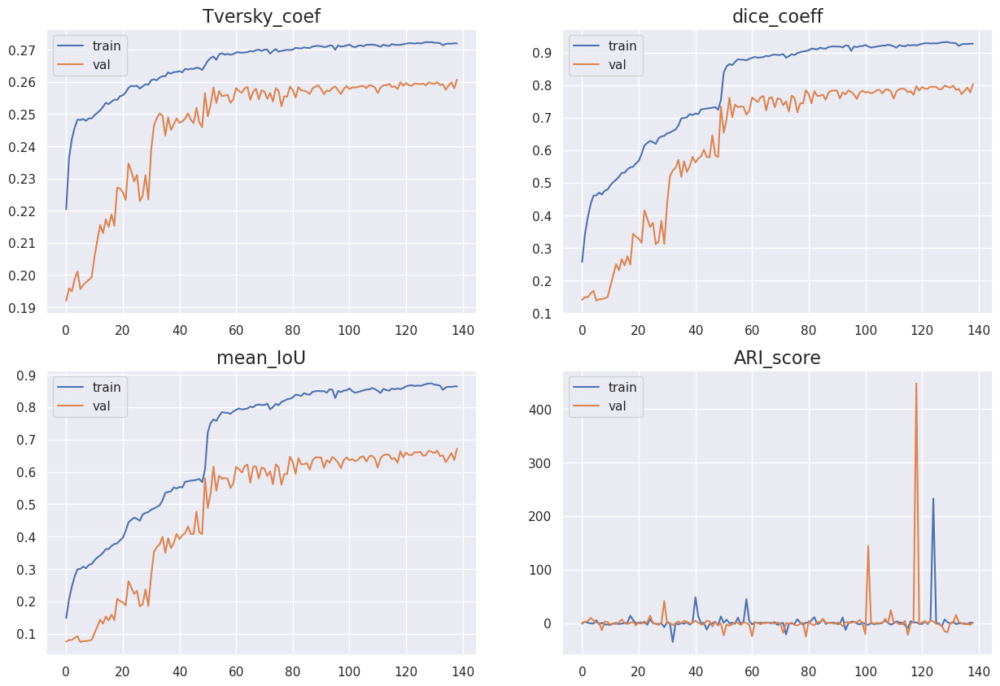

In [20]:
afficher_les_metriques( result_1 )

In [21]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [22]:
img.shape

(10, 128, 256, 3)

In [23]:
mask.shape

(10, 128, 256, 8)

In [24]:
mask_pred = model_1.predict(img)

1/1 [==============================] - 2s 2s/step


In [25]:
mask_pred.shape

(10, 128, 256, 8)

In [26]:
transformer = Mask_To_8_Groups( )

In [27]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

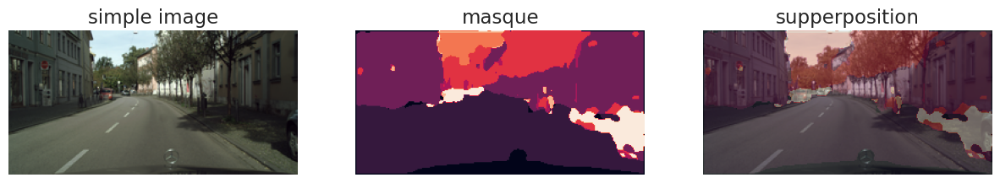

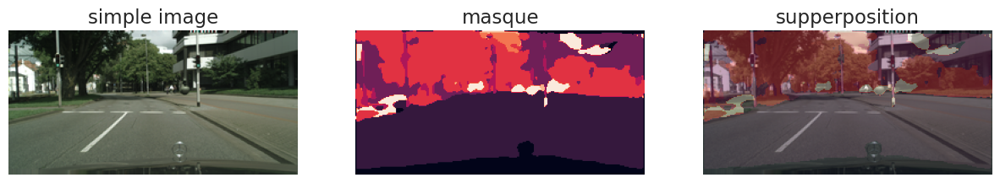

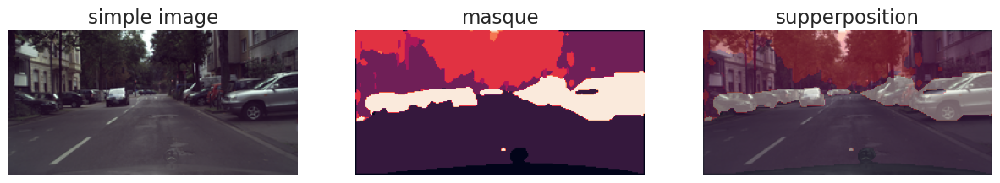

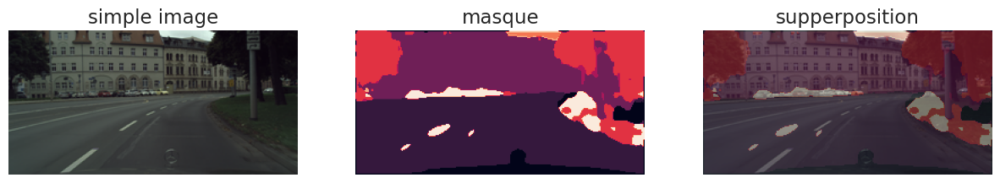

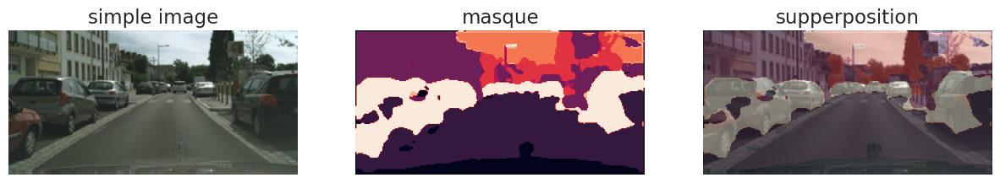

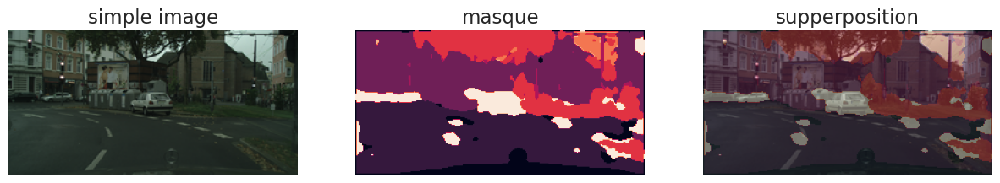

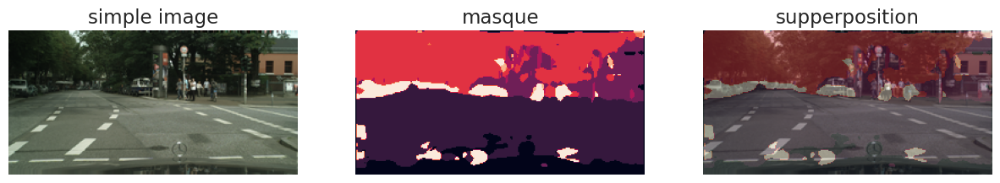

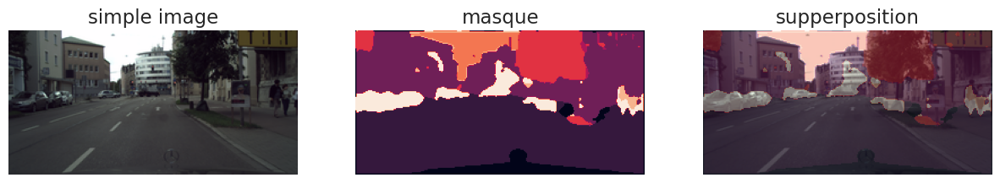

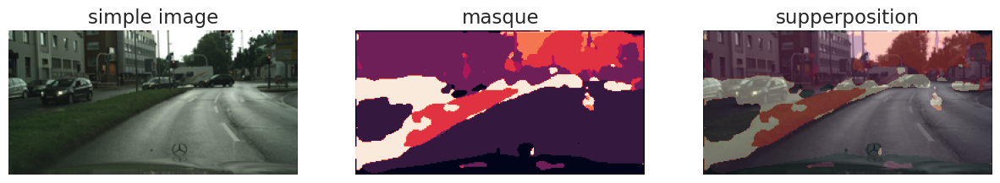

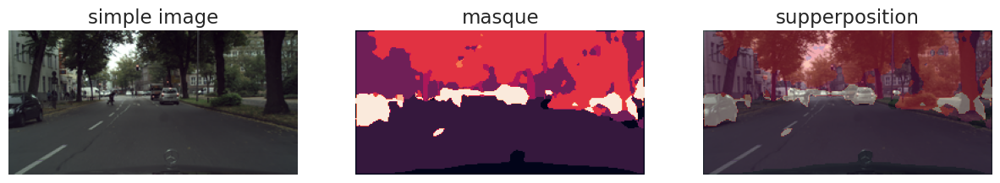

In [28]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [29]:
#resolution des images et masques
aug_2 = False
perte_2 = "dice_loss"
img_res = (128,256,3)

In [30]:
model_2 = TL_unet_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [31]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 25
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [32]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_2, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,2, True, augmentation=aug_2, taille_des_donnees= 5, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 30s 14s/step - loss: 0.7527 - ARI_score: -0.5763 - mean_IoU: 0.1420 - dice_coeff: 0.2473 - Tversky_coef: 0.2166 - val_loss: 0.6224 - val_ARI_score: -635.4517 - val_mean_IoU: 0.2325 - val_dice_coeff: 0.3769 - val_Tversky_coef: 0.2367 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 30s 14s/step - loss: 0.6268 - ARI_score: -1.9320 - mean_IoU: 0.2294 - dice_coeff: 0.3732 - Tversky_coef: 0.2362 - val_loss: 0.6224 - val_ARI_score: 105.8026 - val_mean_IoU: 0.2298 - val_dice_coeff: 0.3736 - val_Tversky_coef: 0.2362 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 30s 14s/step - loss: 0.5965 - ARI_score: -1.5348 - mean_IoU: 0.2527 - dice_coeff: 0.4035 - Tversky_coef: 0.2392 - val_loss: 0.6224 - val_ARI_score: 198.7482 - val_mean_IoU: 0.2288 - val_dice_coeff: 0.3719 - val_Tversky_coef: 0.2359 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 30s 14s/step - loss: 0.5793 - ARI_score: -0.1773 - mean_IoU:

In [33]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.752706,-0.576301,0.142005,0.247294,0.216606,0.622353,-635.451721,0.232469,0.376851,0.236736,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
1,0.626825,-1.931978,0.229443,0.373175,0.236245,0.622358,105.802582,0.229845,0.373649,0.236171,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
2,0.596496,-1.534752,0.252747,0.403504,0.239242,0.622355,198.748169,0.228786,0.371901,0.235932,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
3,0.579281,-0.177287,0.266468,0.420719,0.240710,0.622356,-572.512512,0.232178,0.376849,0.236736,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
4,0.563517,-8.583577,0.279179,0.436483,0.241708,0.696439,-0.215566,0.175572,0.298093,0.223327,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,0.182717,1.564617,0.691026,0.817283,0.257284,0.267769,0.403796,0.580600,0.734493,0.250655,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
113,0.184056,0.259609,0.689110,0.815944,0.256999,0.266970,2.320327,0.584389,0.737478,0.251416,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
114,0.184465,2.405202,0.688527,0.815535,0.256928,0.274689,-0.211925,0.573616,0.728906,0.250197,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
115,0.182942,0.100027,0.690822,0.817058,0.257085,0.276778,0.517643,0.559282,0.716950,0.248808,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False


In [34]:
start = 0

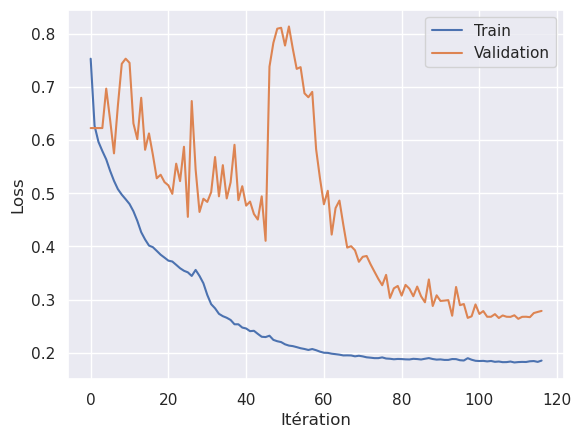

In [35]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


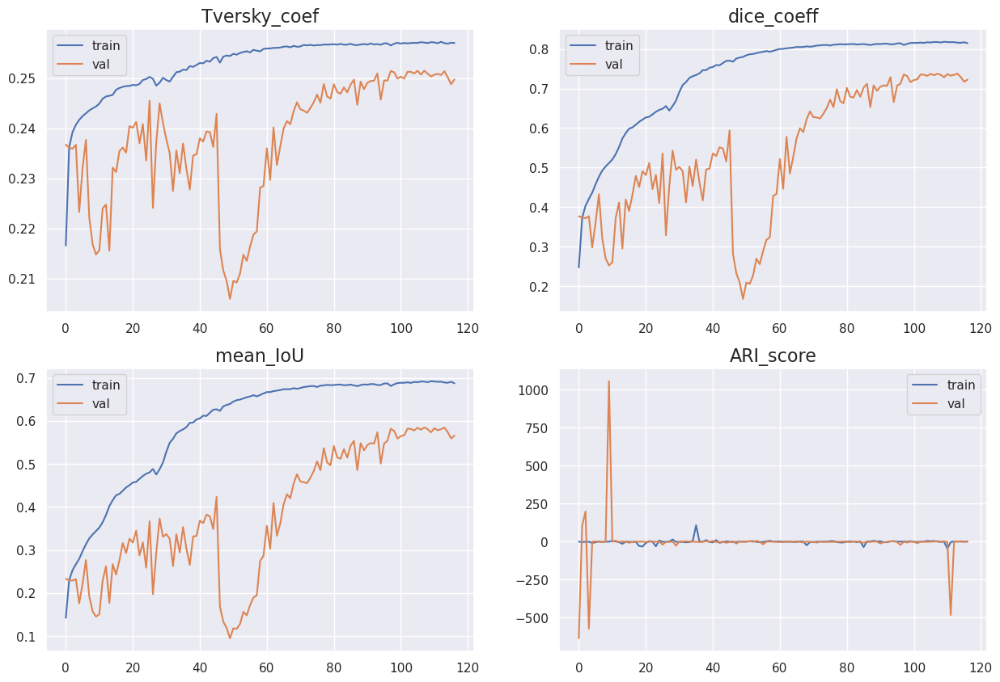

In [36]:
afficher_les_metriques( result_2 )

In [37]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [38]:
img.shape

(10, 128, 256, 3)

In [39]:
mask.shape

(10, 128, 256, 8)

In [40]:
mask_pred = model_2.predict(img)

1/1 [==============================] - 1s 1s/step


In [41]:
mask_pred.shape

(10, 128, 256, 8)

In [42]:
transformer = Mask_To_8_Groups()

In [43]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

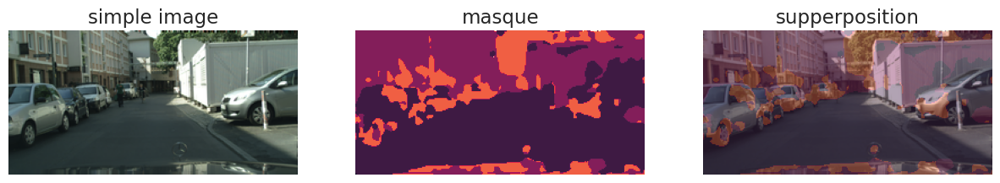

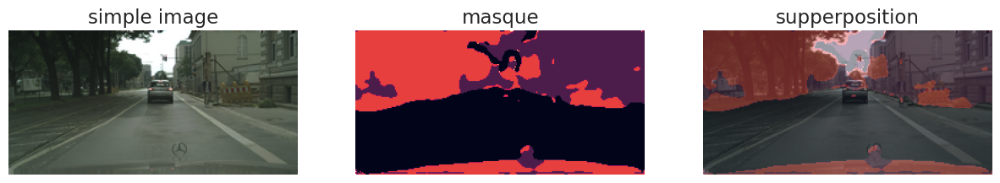

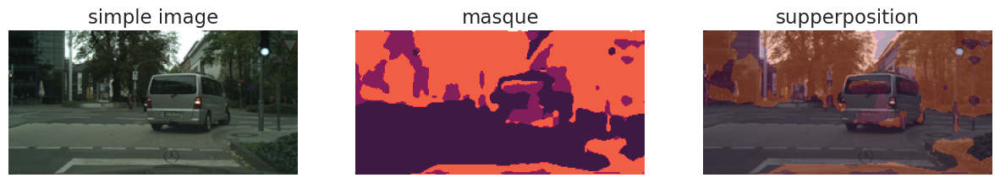

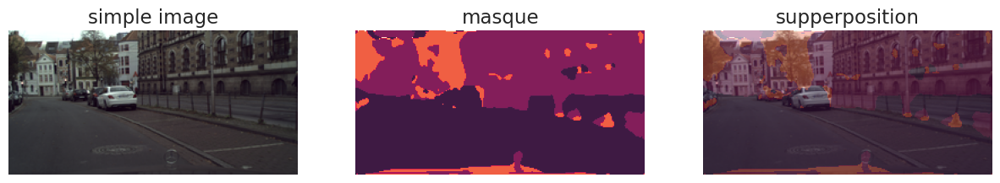

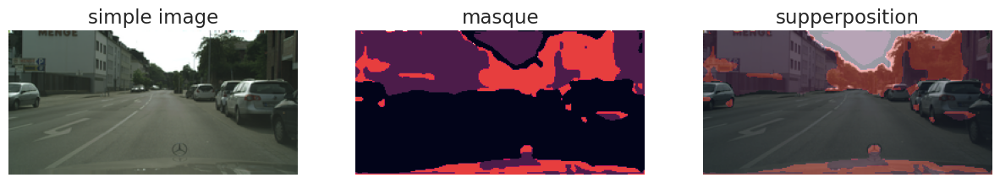

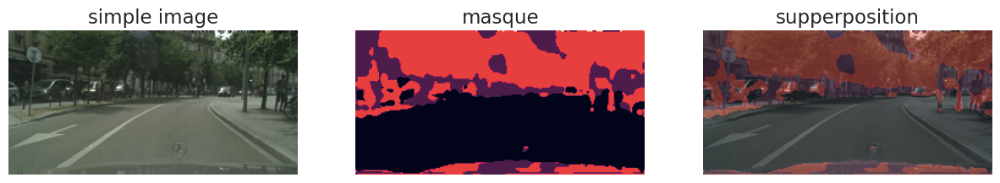

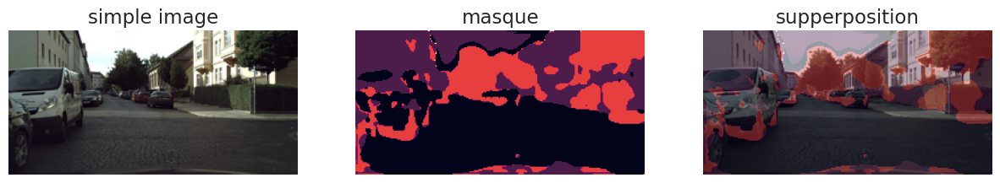

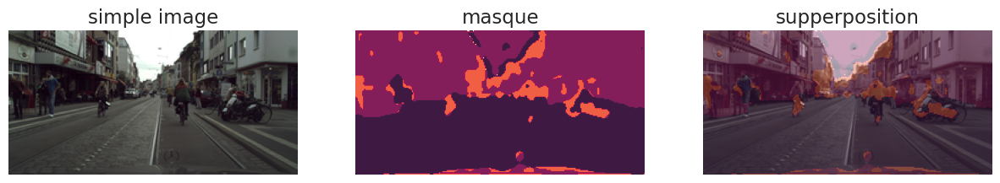

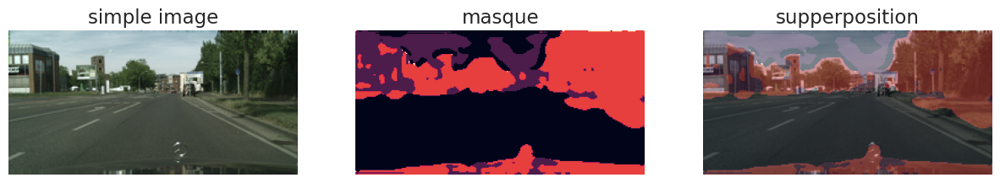

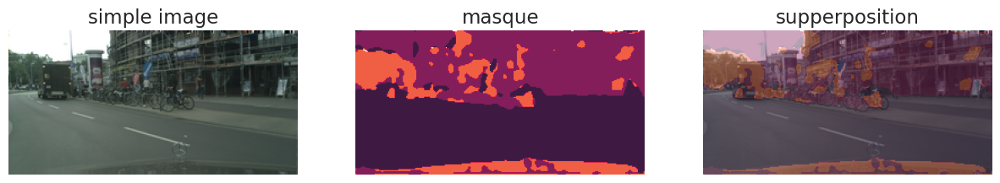

In [44]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [45]:
#resolution des images et masques
aug_3 = False
perte_3 = "categorical_focal_loss"
img_res = (128,256,3)

In [46]:
model_3 = TL_unet_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [47]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 25
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [48]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_3, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_3, taille_des_donnees= 20, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 33s 18s/step - loss: 0.0050 - ARI_score: 1.0750 - mean_IoU: 0.1226 - dice_coeff: 0.2183 - Tversky_coef: 0.2120 - val_loss: 1.0334e-05 - val_ARI_score: 1.1127 - val_mean_IoU: 0.1250 - val_dice_coeff: 0.2222 - val_Tversky_coef: 0.2135 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 32s 17s/step - loss: 2.0177e-05 - ARI_score: -3.6558 - mean_IoU: 0.1279 - dice_coeff: 0.2267 - Tversky_coef: 0.2144 - val_loss: 5.2920e-23 - val_ARI_score: 1.9987 - val_mean_IoU: 0.1250 - val_dice_coeff: 0.2221 - val_Tversky_coef: 0.2134 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 33s 17s/step - loss: 8.6937e-07 - ARI_score: 1.4457 - mean_IoU: 0.1259 - dice_coeff: 0.2236 - Tversky_coef: 0.2137 - val_loss: 5.2920e-23 - val_ARI_score: 1.9987 - val_mean_IoU: 0.1250 - val_dice_coeff: 0.2221 - val_Tversky_coef: 0.2134 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 33s 17s/step - loss: 1.3996e-07 - ARI_score: 0.20

In [49]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,5.000637e-03,1.075009,0.122582,0.218289,0.212012,1.033357e-05,1.112704,0.125010,0.222237,0.213452,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
1,2.017662e-05,-3.655776,0.127864,0.226735,0.214365,5.291953e-23,1.998705,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
2,8.693740e-07,1.445730,0.125856,0.223574,0.213679,5.291953e-23,1.998707,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
3,1.399581e-07,0.199995,0.125268,0.222646,0.213469,5.291953e-23,1.998706,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
4,3.731946e-08,10.690642,0.125073,0.222338,0.213400,5.291953e-23,1.998708,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
5,1.312884e-08,-2.561063,0.124990,0.222207,0.213370,5.291953e-23,1.998704,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
6,6.304936e-09,-4.734602,0.124952,0.222146,0.213357,5.291953e-23,1.998707,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
7,3.321089e-09,3.358229,0.124930,0.222112,0.213349,5.292071e-23,1.997917,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
8,2.215329e-09,-2.275322,0.124921,0.222097,0.213346,1.193156e-17,1.995613,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
9,1.401202e-09,-10.843420,0.124913,0.222084,0.213343,5.044575e-12,2.006536,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False


In [50]:
start = 3

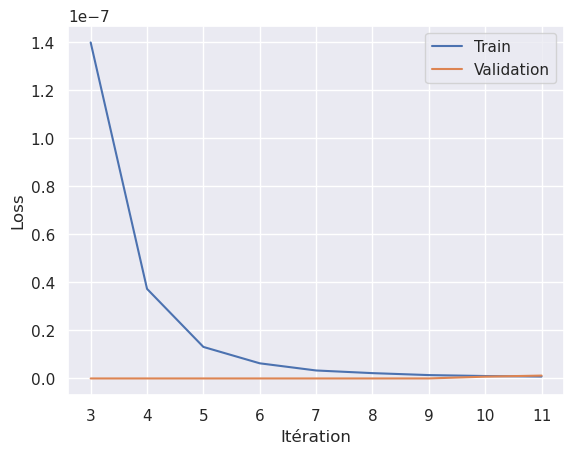

In [51]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


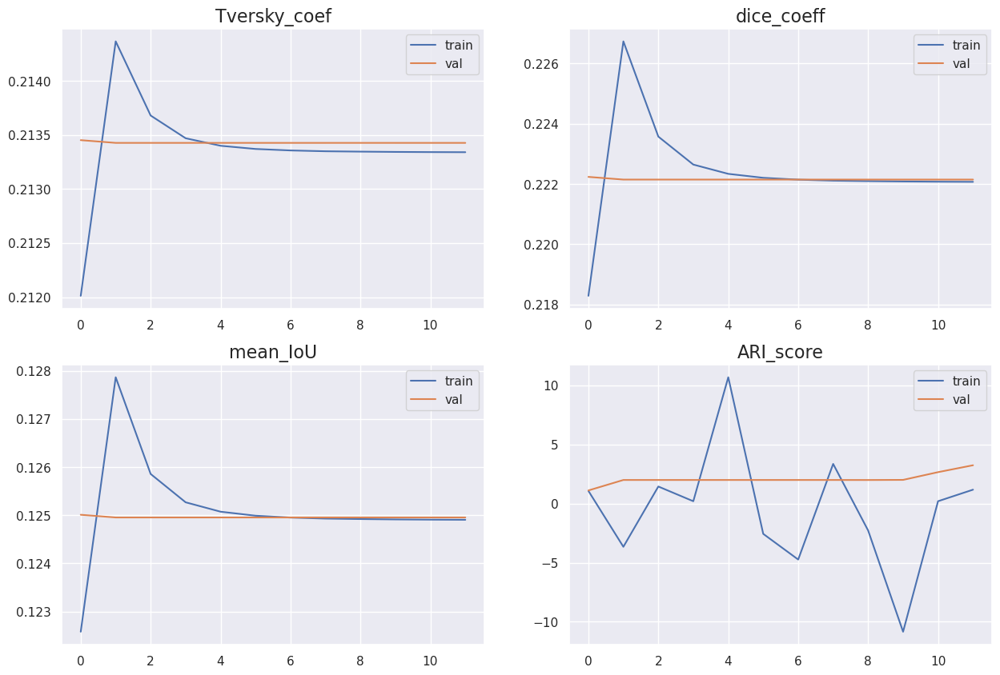

In [52]:
afficher_les_metriques( result_3 )

In [53]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [54]:
img.shape

(10, 128, 256, 3)

In [55]:
mask.shape

(10, 128, 256, 8)

In [56]:
mask_pred = model_3.predict(img)

1/1 [==============================] - 2s 2s/step


In [57]:
mask_pred.shape

(10, 128, 256, 8)

In [58]:
transformer = Mask_To_8_Groups()

In [59]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

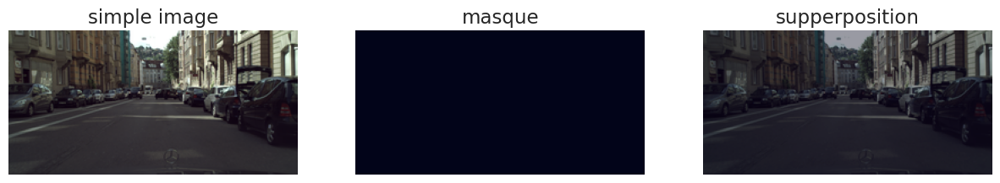

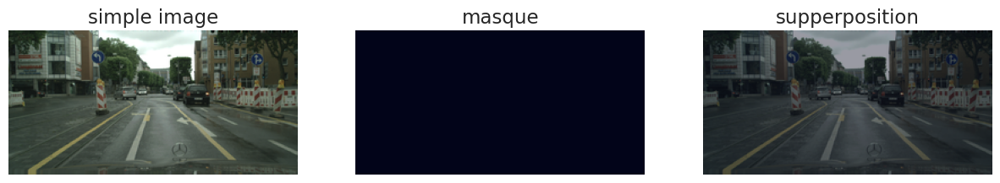

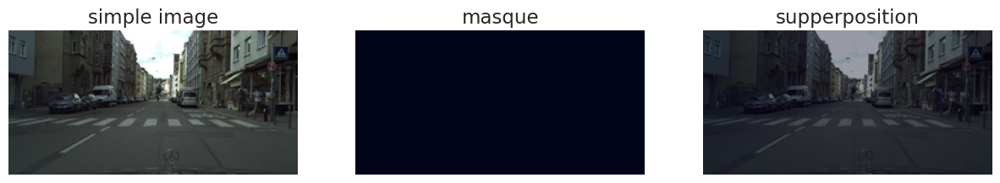

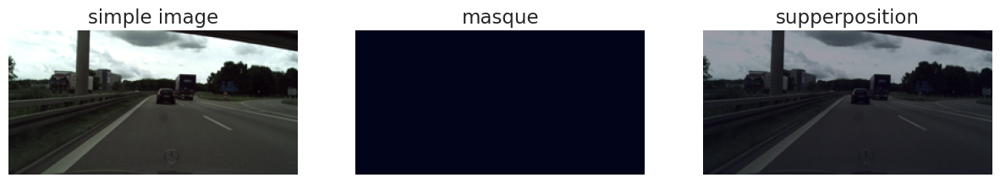

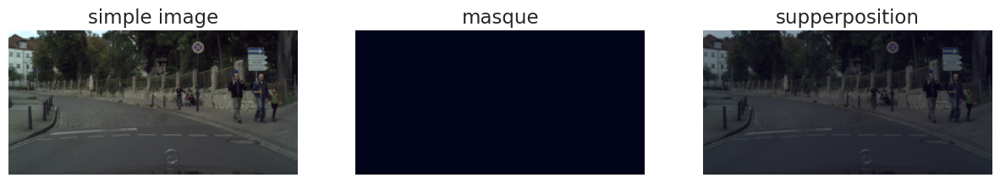

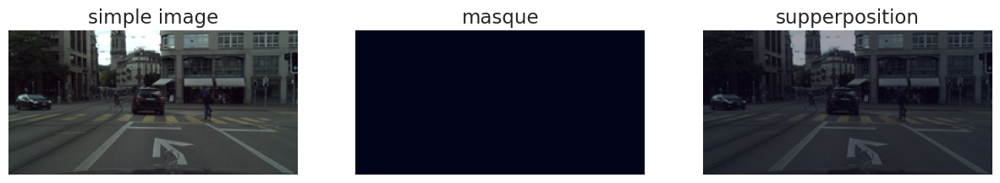

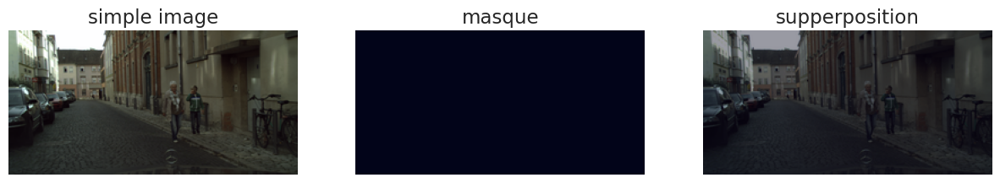

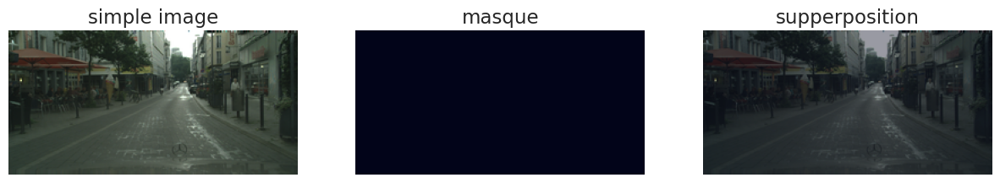

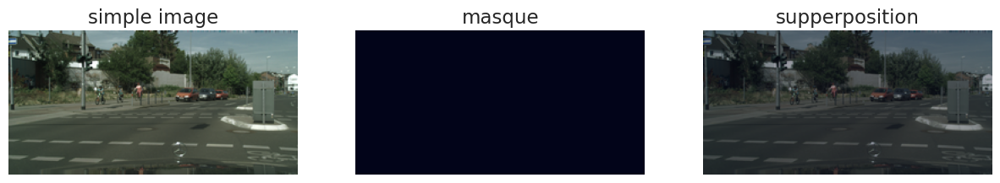

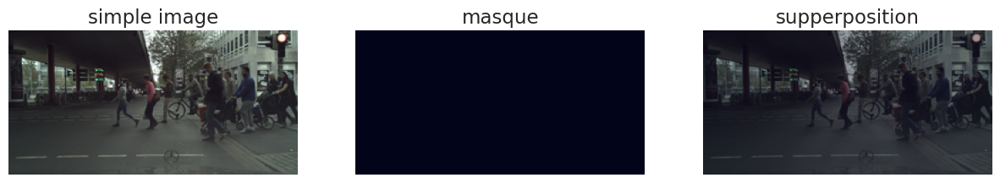

In [60]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [61]:
#resolution des images et masques
aug_4 = False
perte_4 = "categorical_focal_jaccard_loss"
img_res = (128,256,3)

In [62]:
model_4 = TL_unet_model( img_res , 8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [63]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 25
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = False

In [64]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_4, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_4, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 34s 17s/step - loss: 0.8907 - ARI_score: 2.5348 - mean_IoU: 0.1216 - dice_coeff: 0.2167 - Tversky_coef: 0.2117 - val_loss: 1.1908 - val_ARI_score: -0.3700 - val_mean_IoU: 0.0765 - val_dice_coeff: 0.1421 - val_Tversky_coef: 0.1925 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 33s 16s/step - loss: 0.8606 - ARI_score: -6.9863 - mean_IoU: 0.1366 - dice_coeff: 0.2404 - Tversky_coef: 0.2177 - val_loss: 1.1908 - val_ARI_score: -0.5794 - val_mean_IoU: 0.0765 - val_dice_coeff: 0.1420 - val_Tversky_coef: 0.1925 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 32s 16s/step - loss: 0.8453 - ARI_score: 0.8283 - mean_IoU: 0.1467 - dice_coeff: 0.2558 - Tversky_coef: 0.2215 - val_loss: 1.1908 - val_ARI_score: -0.3395 - val_mean_IoU: 0.0765 - val_dice_coeff: 0.1420 - val_Tversky_coef: 0.1925 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 32s 16s/step - loss: 0.8334 - ARI_score: -2.5837 - mean_IoU: 0.157

In [65]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.890664,2.534766,0.121565,0.216672,0.211716,1.190754,-0.369961,0.076478,0.142053,0.192464,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
1,0.860564,-6.986300,0.136613,0.240380,0.217729,1.190797,-0.579391,0.076494,0.142045,0.192462,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
2,0.845298,0.828310,0.146683,0.255820,0.221546,1.190797,-0.339459,0.076454,0.142046,0.192463,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
3,0.833444,-2.583691,0.156971,0.271337,0.224933,1.190797,-0.391373,0.076460,0.142046,0.192463,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
4,0.813832,1.677036,0.162985,0.280287,0.226823,1.190797,0.990322,0.076501,0.142046,0.192463,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
228,0.321099,-1.190254,0.470232,0.639669,0.262832,0.604199,-0.658968,0.379955,0.550377,0.251570,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
229,0.319359,0.129854,0.470845,0.640192,0.262918,0.600031,-0.973038,0.382595,0.552701,0.251165,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
230,0.318814,-1.897706,0.470408,0.639832,0.262696,0.599335,-12.508785,0.386451,0.556482,0.251777,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
231,0.322466,0.179368,0.469511,0.639002,0.262784,0.611711,3.422626,0.385408,0.556047,0.252182,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False


In [66]:
start = 0

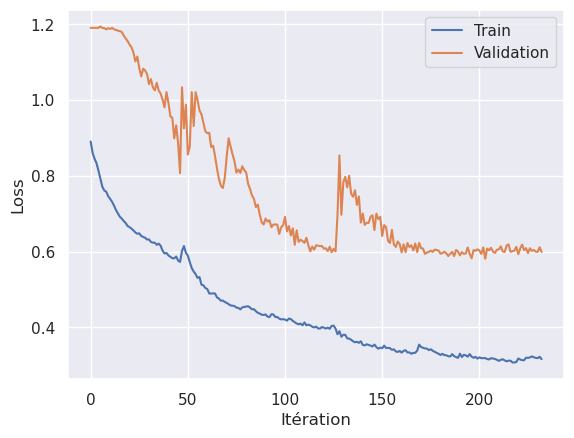

In [67]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


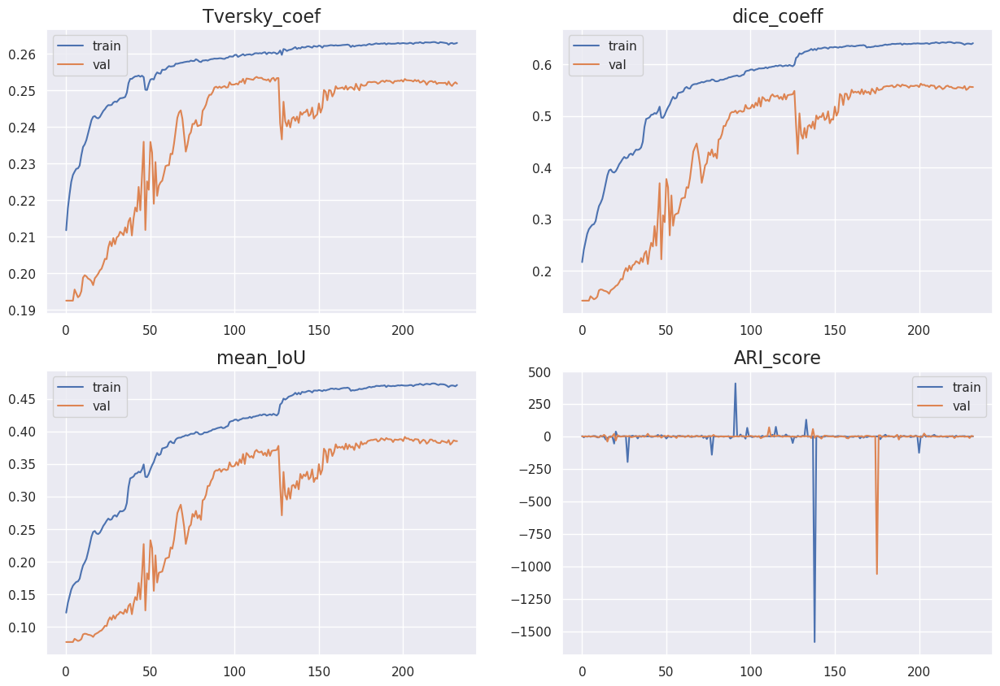

In [68]:
afficher_les_metriques( result_4 )

In [69]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [70]:
img.shape

(10, 128, 256, 3)

In [71]:
mask.shape

(10, 128, 256, 8)

In [72]:
mask_pred = model_4.predict(img)

1/1 [==============================] - 1s 1s/step


In [73]:
mask_pred.shape

(10, 128, 256, 8)

In [74]:
transformer = Mask_To_8_Groups()

In [75]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [76]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

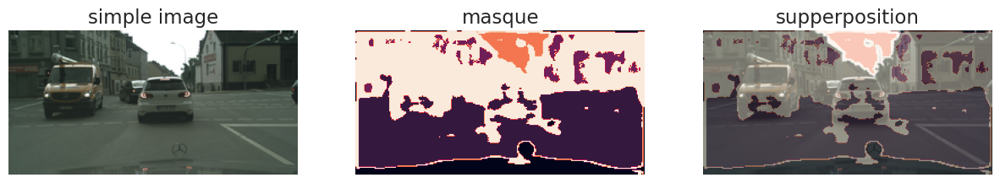

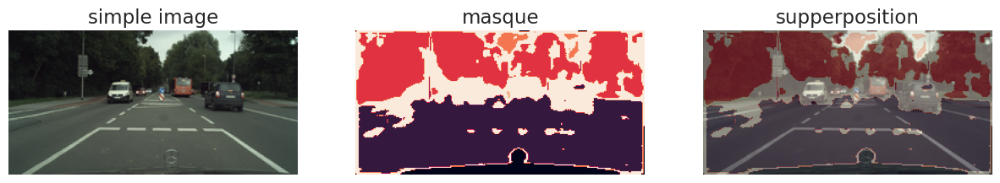

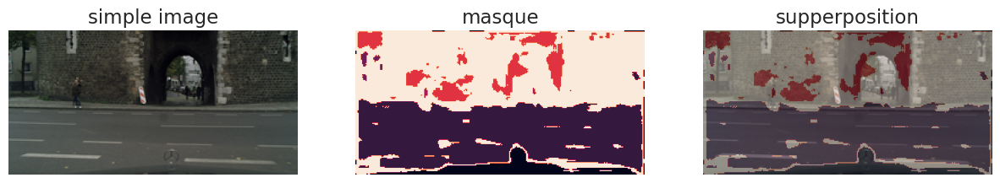

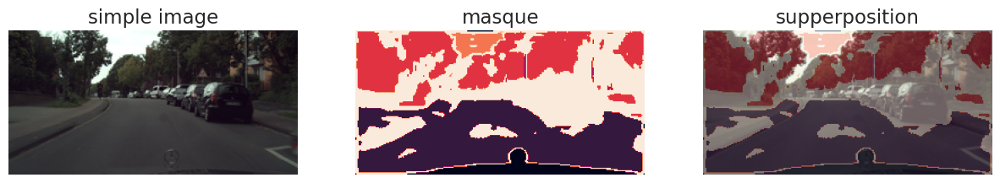

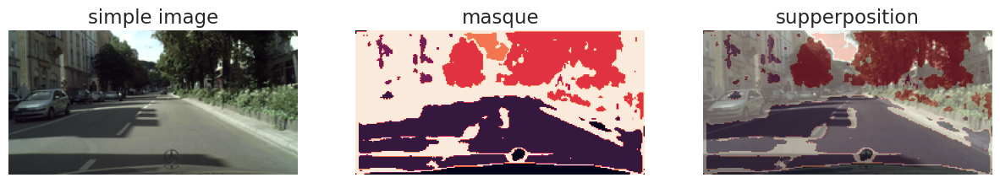

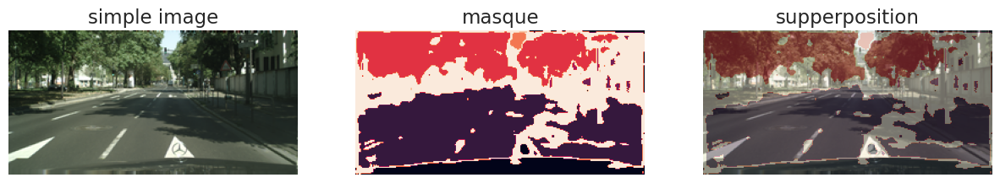

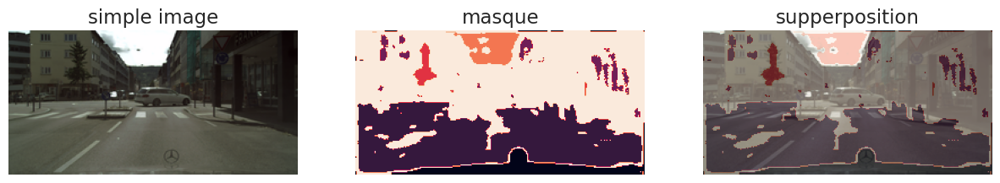

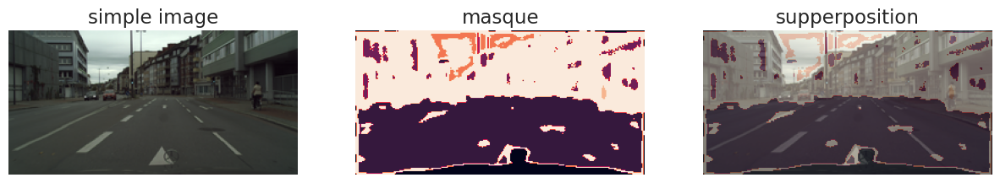

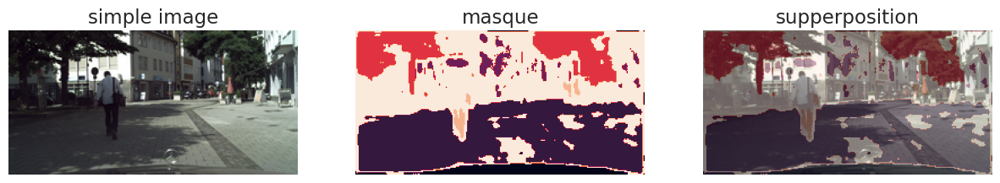

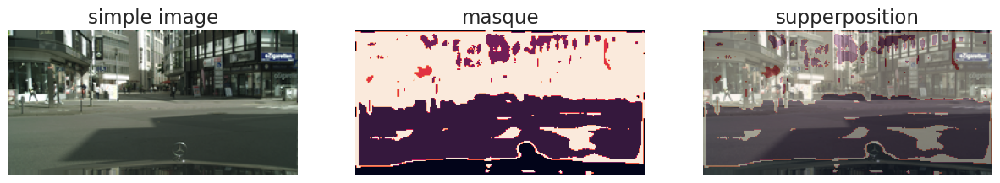

In [77]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [78]:
result_1.iloc[-50:,:].max().values

array([0.3097882568836212, 232.7093963623047, 0.8731712102890015,
       0.9322821497917175, 0.272422730922699, 0.5316809415817261,
       448.068603515625, 0.67158043384552, 0.803408145904541,
       0.26074644923210144, 'Transfert_learning_UNET+512-32+sigmoid',
       'jaccard_loss', False], dtype=object)

In [79]:
recap = pd.DataFrame([result_1.iloc[-70:,:].max().values , 
              result_2.iloc[-70:,:].max().values,
              result_3.iloc[-70:,:].max().values, 
              result_4.iloc[-70:,:].max().values],
             columns= result_1.keys()
            ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.873171,0.932282,0.272423,0.671580,0.803408,0.260746,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
1,0.692255,0.818143,0.257284,0.584506,0.737478,0.251513,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
2,0.127864,0.226735,0.214365,0.125010,0.222237,0.213452,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
3,0.473964,0.643112,0.263179,0.391755,0.562504,0.253074,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False


In [80]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.873171,0.932282,0.272423,0.671580,0.803408,0.260746,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
1,0.692255,0.818143,0.257284,0.584506,0.737478,0.251513,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
2,0.127864,0.226735,0.214365,0.125010,0.222237,0.213452,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
3,0.473964,0.643112,0.263179,0.391755,0.562504,0.253074,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False


In [81]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)


# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [82]:
#resolution des images et masques
aug_5 = False
perte_5 = "categorical_focal_dice_loss"
img_res = (128,256,3)

In [83]:
model_5 = TL_unet_model( img_res , 8)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 128, 256, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 128, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [84]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.95)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 25
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [85]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,25, True, augmentation=aug_5, taille_des_donnees= 50, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,5, True, augmentation=aug_5, taille_des_donnees= 15, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
2/2 [==============================] - 35s 17s/step - loss: 0.8185 - ARI_score: 2.2161 - mean_IoU: 0.1147 - dice_coeff: 0.2057 - Tversky_coef: 0.2092 - val_loss: 1.1326 - val_ARI_score: 1.3253 - val_mean_IoU: 0.0773 - val_dice_coeff: 0.1435 - val_Tversky_coef: 0.1929 - lr: 0.0200
Epoch 2/450
2/2 [==============================] - 32s 16s/step - loss: 0.7864 - ARI_score: -1.9320 - mean_IoU: 0.1345 - dice_coeff: 0.2371 - Tversky_coef: 0.2170 - val_loss: 1.1446 - val_ARI_score: -1.3107 - val_mean_IoU: 0.0767 - val_dice_coeff: 0.1424 - val_Tversky_coef: 0.1926 - lr: 0.0200
Epoch 3/450
2/2 [==============================] - 32s 16s/step - loss: 0.7699 - ARI_score: 2.1137 - mean_IoU: 0.1522 - dice_coeff: 0.2642 - Tversky_coef: 0.2233 - val_loss: 1.1438 - val_ARI_score: 1.2568 - val_mean_IoU: 0.0768 - val_dice_coeff: 0.1425 - val_Tversky_coef: 0.1926 - lr: 0.0200
Epoch 4/450
2/2 [==============================] - 32s 16s/step - loss: 0.7591 - ARI_score: 97.8879 - mean_IoU: 0.1647 

In [86]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.818519,2.216141,0.114705,0.205683,0.209221,1.132645,1.325333,0.077317,0.143452,0.192865,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
1,0.786384,-1.931958,0.134488,0.237081,0.216952,1.144580,-1.310721,0.076655,0.142387,0.192610,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
2,0.769931,2.113657,0.152220,0.264188,0.223326,1.143811,1.256820,0.076770,0.142545,0.192645,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
3,0.759129,97.887886,0.164654,0.282741,0.227275,1.131868,-0.509619,0.077433,0.143700,0.192922,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
4,0.753507,2.038162,0.169421,0.289751,0.228664,1.116053,0.952543,0.078764,0.146024,0.193453,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,0.235103,-0.533101,0.502681,0.669044,0.263902,0.442682,0.678069,0.445380,0.616280,0.258036,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
134,0.231744,15.437630,0.506420,0.672331,0.264189,0.450998,0.704323,0.441529,0.612569,0.257560,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
135,0.226590,1.140856,0.506401,0.672324,0.264178,0.437193,2.086531,0.441699,0.612721,0.257401,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False
136,0.230769,-0.478704,0.506588,0.672496,0.264265,0.441353,1.543280,0.443764,0.614580,0.258178,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False


In [87]:
start = 0

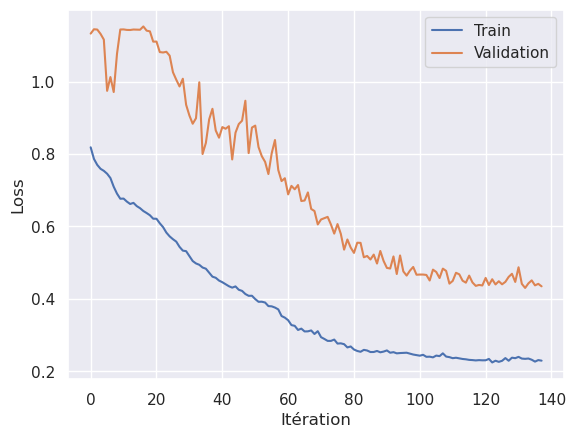

In [88]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


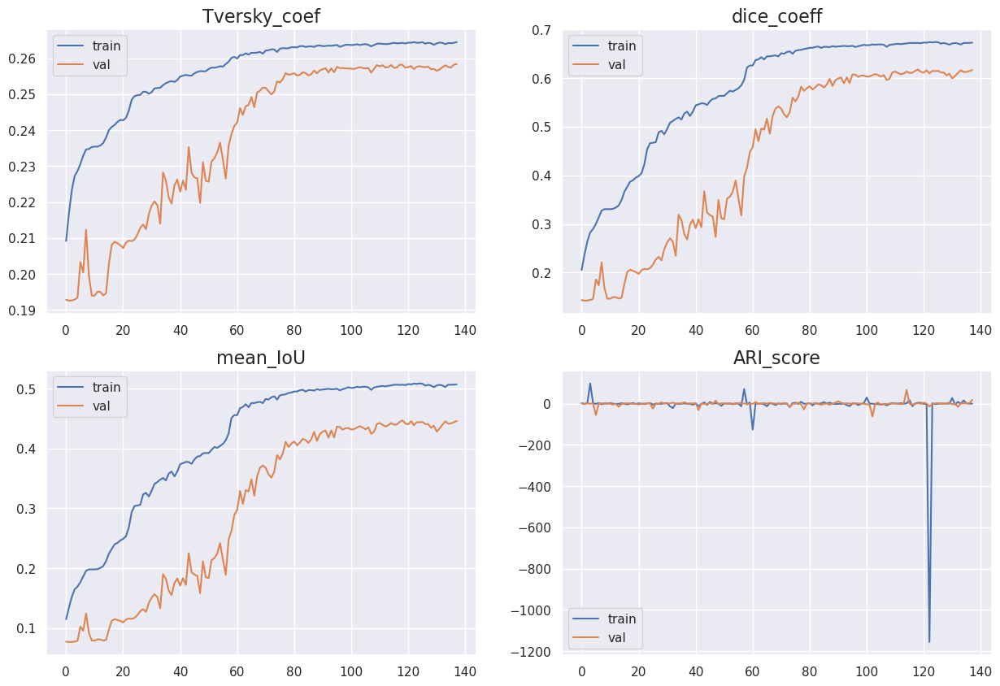

In [89]:
afficher_les_metriques( result_5 )

In [90]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [91]:
img.shape

(10, 128, 256, 3)

In [92]:
mask.shape

(10, 128, 256, 8)

In [93]:
mask_pred = model_5.predict(img)

1/1 [==============================] - 1s 1s/step


In [94]:
mask_pred.shape

(10, 128, 256, 8)

In [95]:
transformer = Mask_To_8_Groups()

In [96]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [97]:
np.unique( mask_pred )

array([0, 1, 2, 3, 6])

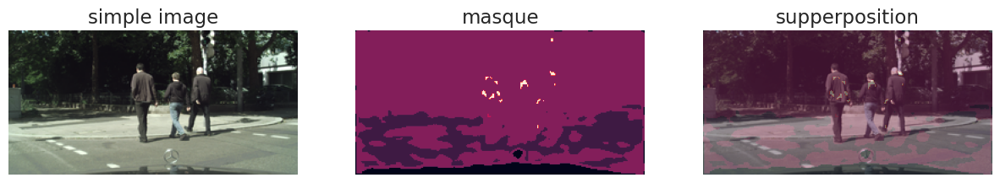

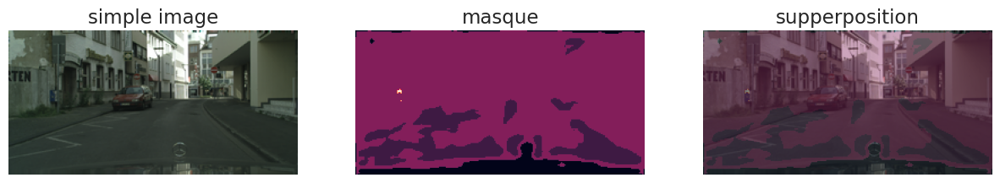

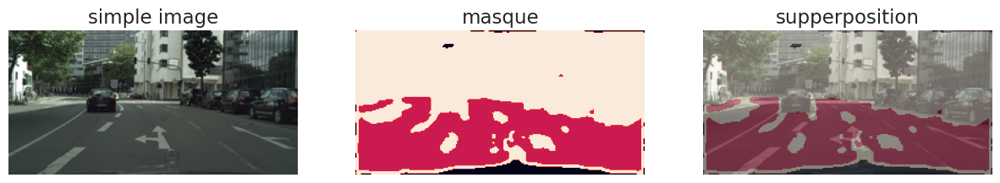

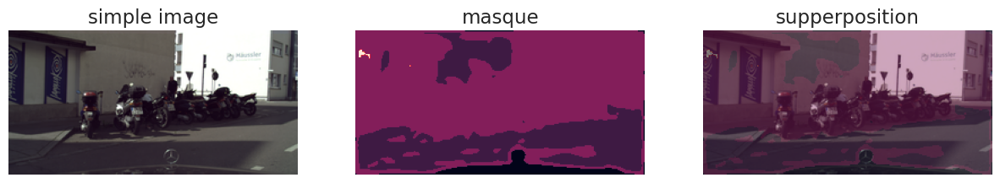

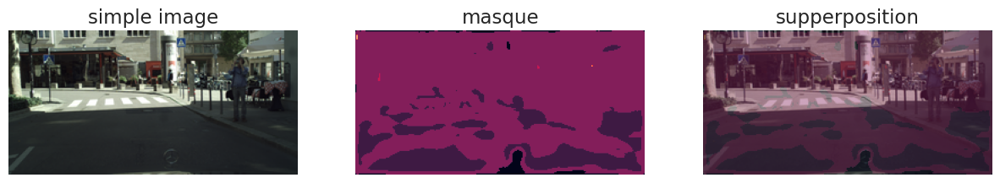

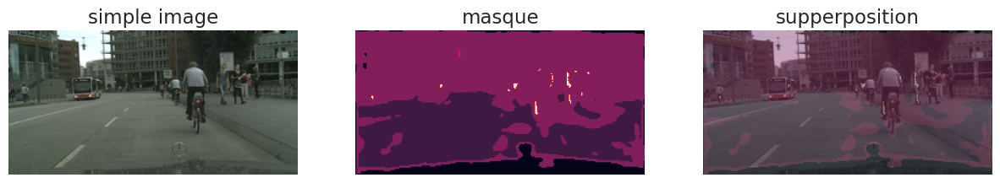

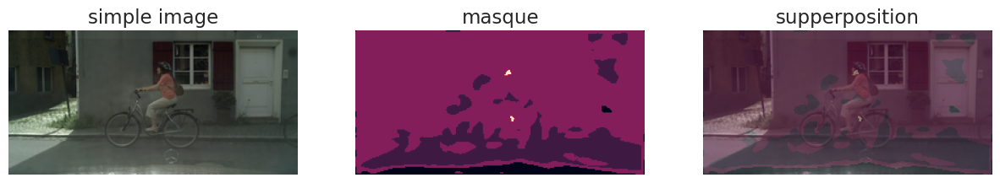

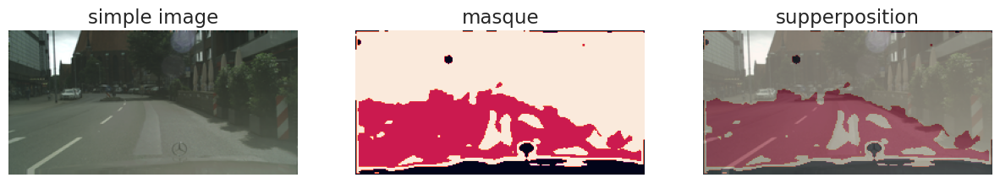

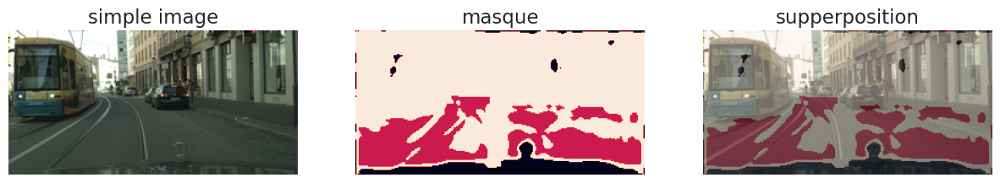

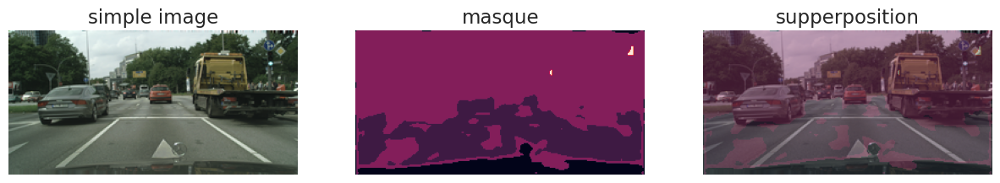

In [98]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [99]:
recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
                     ],
                     columns= result_1.keys()
                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.873171,0.932282,0.272423,0.671580,0.803408,0.260746,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
1,0.692255,0.818143,0.257284,0.584506,0.737478,0.251513,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
2,0.124952,0.222146,0.213357,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
3,0.473964,0.643112,0.263179,0.391755,0.562504,0.253398,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
4,0.508664,0.674242,0.264489,0.446941,0.617678,0.258399,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False


In [100]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.873171,0.932282,0.272423,0.671580,0.803408,0.260746,Transfert_learning_UNET+512-32+sigmoid,jaccard_loss,False
1,0.692255,0.818143,0.257284,0.584506,0.737478,0.251513,Transfert_learning_UNET+512-32+sigmoid,dice_loss,False
2,0.124952,0.222146,0.213357,0.124953,0.222148,0.213427,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_loss,False
3,0.473964,0.643112,0.263179,0.391755,0.562504,0.253398,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_jaccard_loss,False
4,0.508664,0.674242,0.264489,0.446941,0.617678,0.258399,Transfert_learning_UNET+512-32+sigmoid,categorical_focal_dice_loss,False


In [101]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
